# Elements Available in PSSFSS
This Jupyter notebook illustrates the styles of Frequency Selective Surface (FSS) and Polarization Selective Surface (PSS) elements that are available in the `PSSFSS` package.  Because the package includes a `Plots` recipe, the `Plots.plot` function automatically knows how to plot a variable of type `RWGSheet` that is returned by any of the constructor functions illustrated beow. As shown below, additional keywords are supported by the `plot` function that allow control of edge and/or face colors, inclusion of the unit cell boundary in the plot, and repetition of the unit cell to visualize the element in its arrayed environment.

In [1]:
using PSSFSS
using Plots
default(framestyle=:box)

┌ Info: Precompiling PSSFSS [6b20a5d4-3c6c-44cd-883b-1480592d72be]
└ @ Base loading.jl:1260


Help is available for any of the element types shown below, by typing, e.g.
```julia
?rectstrip
```
at the Julia prompt.

## RECTSTRIP: Rectangular Strip
This element is typically used to model polarization grids, but it can also be
used for rectangular or square FSS elements.  It uses a structured mesh so `fufp` defaults to `true`.

90 triangles


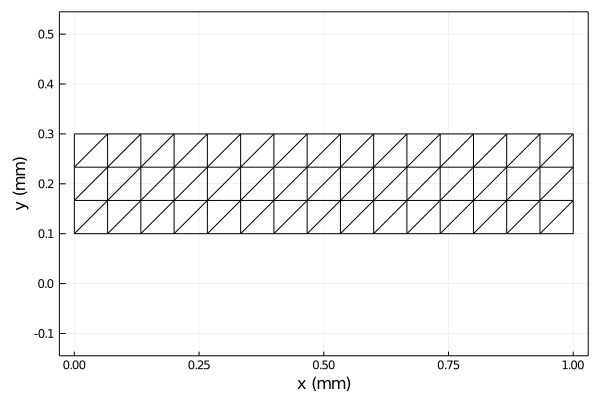

In [2]:
sheet = rectstrip(Lx=1, Ly=0.2, Px=1, Py=0.4, Nx=15, Ny=3, units=mm)
println("$(size(sheet.fv,2)) triangles")
plot(sheet)

The above plot of the triangulation edges is useful, but a better visualation includes the unit cell boundary, adds color to the edges, and displays multiple adjacent unit cells:

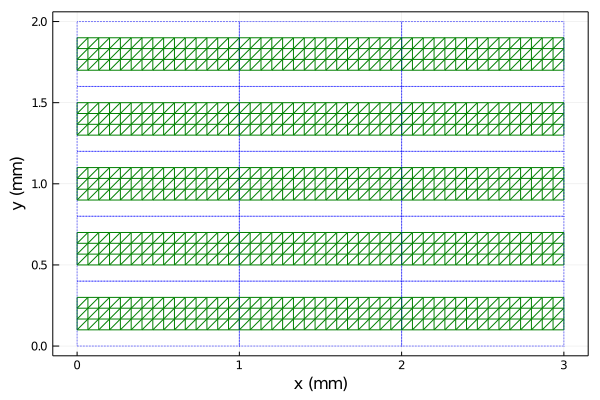

In [3]:
plot(sheet, linecolor=:green, unitcell=true, rep=(3,5))

Below, we show how a `rectstrip` can be used to model a square FSS element:

450 triangles


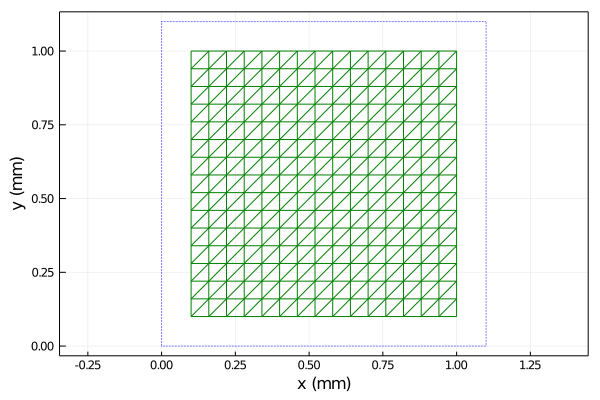

In [4]:
sheet = rectstrip(Lx=0.9, Ly=0.9, Px=1.1, Py=1.1, Nx=15, Ny=15, units=mm)
println("$(size(sheet.fv,2)) triangles")
plot(sheet, linecolor=:green, unitcell=true)

## POLYRING: A Very Versatile Element
The first example shows how to model concentric square loops.

876 triangles


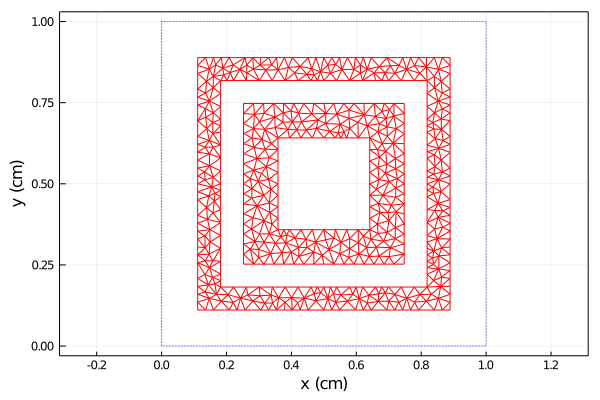

In [5]:
ntri=800
sheet = polyring(s1=[1,0], s2=[0,1], a=[0.2, 0.45], b=[0.35, 0.55], sides=4, orient=45, 
                 units=cm, ntri=ntri)
println("$(size(sheet.fv,2)) triangles")
plot(sheet, linecolor=:red, unitcell=true)

Next, we have an octagonal hole, and an octagonal, annular slot.  Such a geometry could be more efficiently modeled
by making use of a sheet of class `M`, and triangulating the complementary
(smaller in area) region to that shown below.  However, 
if one needs to model this type of inductive element while 
including the surface resistance of the sheet, 
this can only be done using a sheet of class `J` (the default)

426 triangles


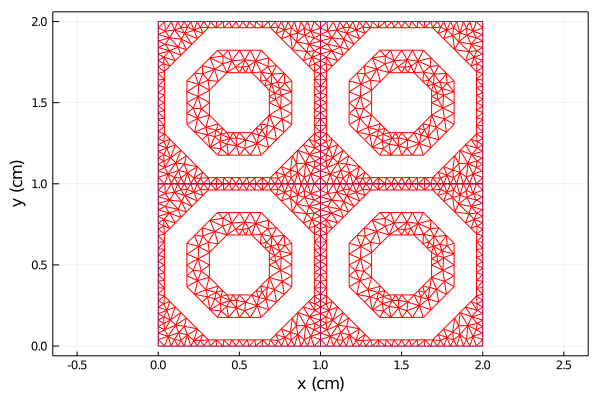

In [6]:
ntri=400
sheet = polyring(s1=[1,0], s2=[0,1], a=[0.2, 0.5], b=[0.35, -25], sides=8, orient=22.5, 
                 units=cm, ntri=ntri)
println("$(size(sheet.fv,2)) triangles")
plot(sheet, linecolor=:red, rep=(2,2), unitcell=true)

Below we approximate a circular loop using a 32-sided polygonal annulus. The 
lattice vectors are chosen to represent a close-packed (hexagonal) arrangement.

431 triangles


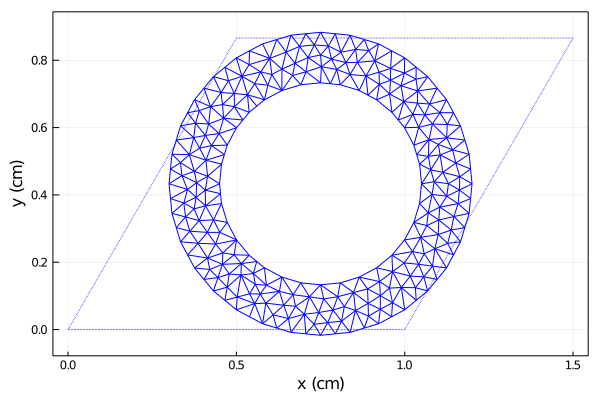

In [7]:
sheet = polyring(s1=[1, 0], s2=[0.5, √3/2], a=[0.3], b=[0.45], sides=32, 
                 units=cm, ntri=400)
println("$(size(sheet.fv,2)) triangles")
plot(sheet, unitcell=true, linecolor=:blue)

We illustrate the hexagonal arrangement by replicating 3 unit cells in each principal direction.

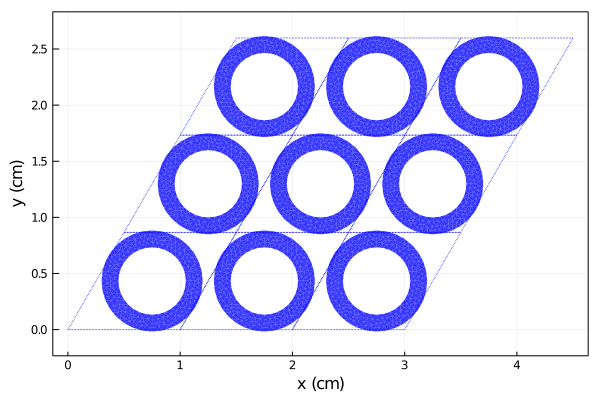

In [8]:
plot(sheet, edges=false, faces=true, rep=(3,3), unitcell=true)

## MEANDER: Used to model meanderline polarizers.
This is another element that employs a structured mesh, so that `fufp` defaults to `true` for this element style.

336 triangles


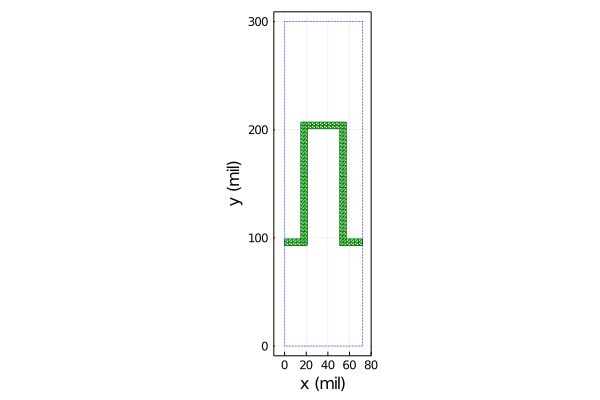

In [9]:
sheet = meander(a=72, b=300, h=114, w1=6, w2=6, units=mil, ntri=300) 
println("$(size(sheet.fv,2)) triangles")
plot(sheet, linecolor=:green, unitcell=true, xlim=(-10,80))

The meanderline is typically rotated $45^\circ$ as shown below.

336 triangles


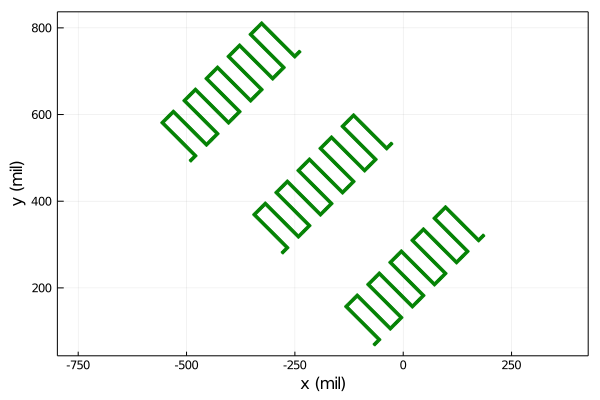

In [10]:
sheet = meander(a=72, b=300, h=114, w1=6, w2=6, units=mil, ntri=300, rot=45) 
println("$(size(sheet.fv,2)) triangles")
p=plot(sheet, linecolor=:green, rep=(5,3))
savefig("meanderlines.png")
p

Another useful element, shown in the next few figures, is the `loadedcross`, which as you can see in the first figure, does not actually have to be loaded.

## LOADEDCROSS

First, we shown an "unloaded" cross.

320 triangles


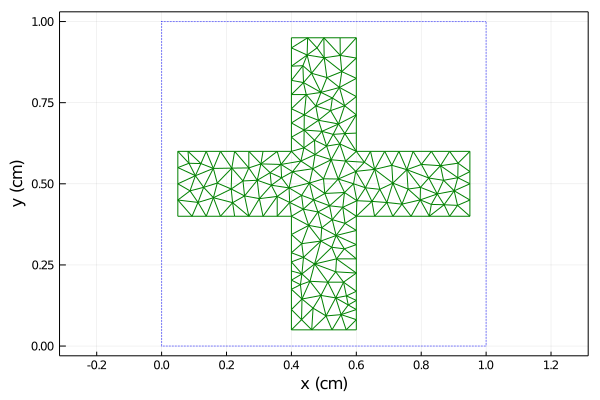

In [11]:
sheet = loadedcross(s1=[1,0], s2=[0,1], L1=0.9, L2=0.2, w=0.35, units=cm, ntri=300) 
println("$(size(sheet.fv,2)) triangles")
plot(sheet, linecolor=:green, unitcell=true)

Proper choice of the geometrical parameters `w` and `L2` exposes the "loaded" area.

420 triangles


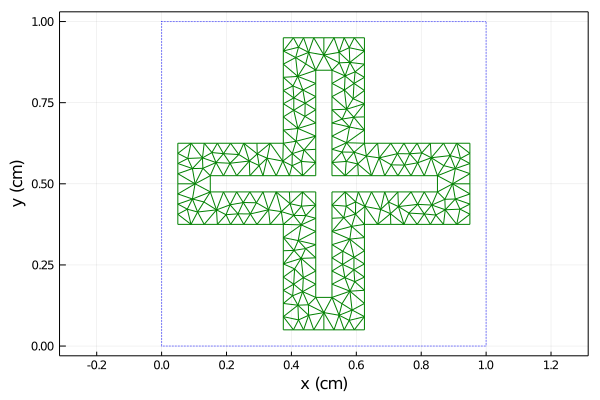

In [12]:
sheet = loadedcross(s1=[1,0], s2=[0,1], L1=0.9, L2=0.25, w=0.1, units=cm, ntri=400)
println("$(size(sheet.fv,2)) triangles")
plot(sheet, linecolor=:green, unitcell=true)

The plot below shows how this element can be used to model crosses in a hexagonal arrangement.

321 triangles


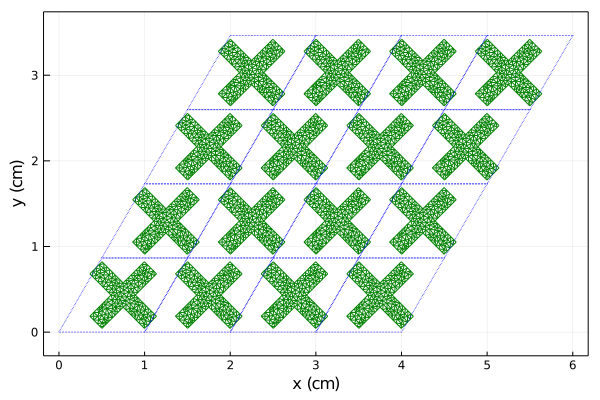

In [13]:
sheet = loadedcross(s1=[1,0], s2=[0.5,sqrt(3)/2], L1=0.9, L2=0.2, w=0.35, units=cm, ntri=300, orient=45) 
println("$(size(sheet.fv,2)) triangles")
plot(sheet, linecolor=:green, unitcell=true, rep=(4,4))

## JERUSALEMCROSS

The final element type is `jerusalemcross`, the Jerusalem cross.  It can also be "loaded" or "unloaded" as shown in the next few plots.

First, fully loaded:

660 triangles


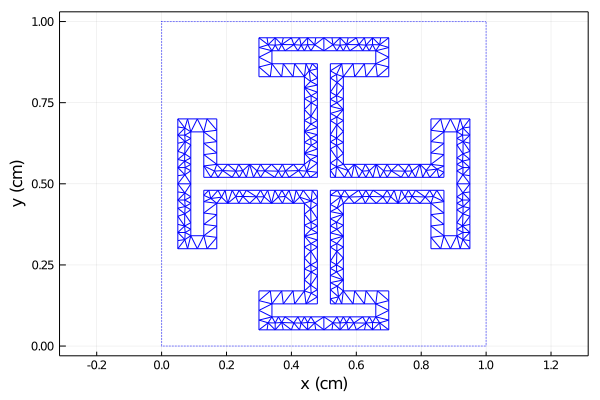

In [14]:
sheet = jerusalemcross(P=1, L1=0.9, L2=0.12, w=0.04, A = 0.4, B = 0.12, units=cm, ntri=600) 
println("$(size(sheet.fv,2)) triangles")
plot(sheet, linecolor=:blue, unitcell=true)

Next, unloaded (i.e., solid).

659 triangles


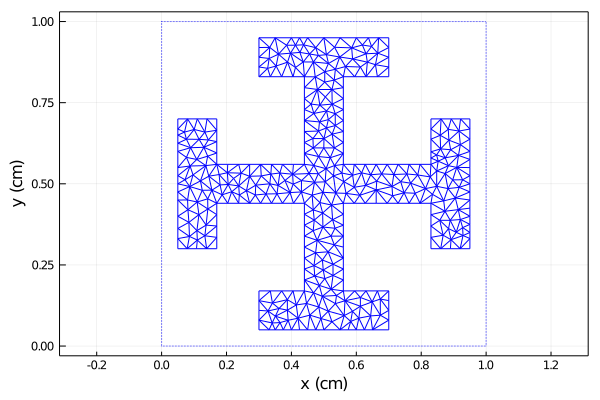

In [15]:
sheet = jerusalemcross(P=1, L1=0.9, L2=0.12, w=0.5, A = 0.4, B = 0.12, units=cm, ntri=600) 
println("$(size(sheet.fv,2)) triangles")
plot(sheet, linecolor=:blue, unitcell=true)

The next two plots show how the element may be partially loaded, on only its arms, or on the capacitive endcaps.

654 triangles


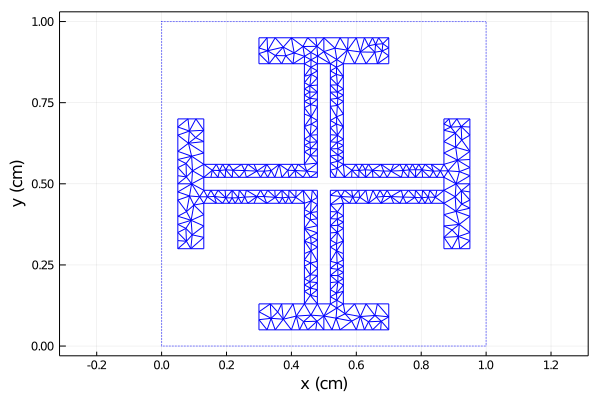

In [16]:
sheet = jerusalemcross(P=1, L1=0.9, L2=0.12, w=0.04, A = 0.4, B = 0.08, units=cm, ntri=600) 
println("$(size(sheet.fv,2)) triangles")
plot(sheet, linecolor=:blue, unitcell=true)

In [17]:
sheet = jerusalemcross(P=1, L1=0.9, L2=0.12, w=0.04, A = 0.4, B = 0.08, units=cm, ntri=200) 
println("$(size(sheet.fv,2)) triangles")
p=plot(sheet, edgecolor=:blue, faces=true, facecolor=:blue, rep=(4,4))
savefig("jcrossarray.png")
p

220 triangles


652 triangles


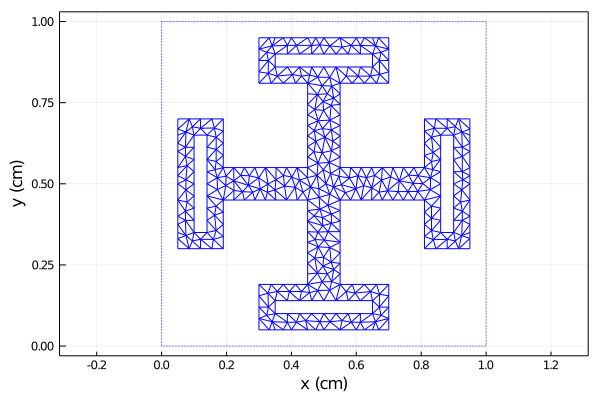

In [18]:
sheet = jerusalemcross(P=1, L1=0.9, L2=0.1, w=0.05, A = 0.4, B = 0.14, units=cm, ntri=600) 
println("$(size(sheet.fv,2)) triangles")
plot(sheet, linecolor=:blue, unitcell=true)

Below, we show the help information provided for the `jerusalemcross`.  Analogous information is available for the other element styles.

In [19]:
?jerusalemcross

search: jerusalemcross



```
jerusalemcross(;P::Real, L1::Real, L2::Real, A::Real, B::Real, w::Real, 
             ntri::Int, units::PSSFSSLength, kwargs...)
```

# Description:

Create a variable of type `RWGSheet` that contains the triangulation for a "loaded cross" type of geometry. The returned value has fields `s₁`, `s₂`, `β₁`, `β₂`, `ρ`, `e1`, `e2`, `fv`, `fe`,  and `fr` properly initialized.

The following "ascii art" attempts to show the definitions of the geometrical parameters `P`, `L1`, `L2`, `A`, `B`, and `w`. Note that the structure is supposed to be symmetrical wrt reflections about its horizontal and vertical centerlines, and wrt reflections through a line oriented at a 45 degree angle wrt the x-axis.

```
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓ 
┃                                                       ┃ _______
┃               ┌────────────────────────┐              ┃    ↑
┃               │ ┌───────────────────┐  │              ┃    │
┃               │ └───────┐    ┌──────┘  │              ┃    │
┃               └──────┐  │    │ ┌───────┘              ┃    │
┃                      │  │    │ │                      ┃    │
┃  ┌───────┐           │  │    │ │            ┌──────┐  ┃    │
┃  │  ┌─┐  │           │  │    │ │            │ ┌──┐ │  ┃    │
┃  │  │ │  │           │  │   →│ │← w         │ │  │ │  ┃    │
┃  │  │ │  │           │  │    │ │            │ │  │ │  ┃    │
┃  │  │ │  └───────────┘  │    │ └────────────┘ │  │ │  ┃    │
┃  │  │ └─────────────────┘    └────────────────┘  │ │  ┃    
┃  │  │                                            │ │  ┃   L1 
┃  │  │ ┌─────────────────┐    ┌────────────────┐  │ │  ┃  
┃  │  │ │  ┌───────────┐  │    │ ┌────────────┐ │  │ │  ┃    │
┃  │  │ │  │           │  │    │ │            │ │  │ │  ┃    │
┃  │  │ │  │           │  │    │ │            │ │  │ │  ┃    │
┃  │  └─┘  │          →│  │    │ │← L2     B →│ └──┘ │← ┃    │
┃  └───────┘           │  │    │ │            └──────┘  ┃    │
┃                      │  │    │ │                      ┃    │
┃               ┌──────┘  │    │ └───────┐              ┃    │
┃               │ ┌───────┘    └──────┐  │              ┃    │
┃               │ └───────────────────┘  │              ┃    │
┃               └────────────────────────┘              ┃ ___↓___
┃               |<───────── A ──────────>|              ┃
┗━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┛ 
|<─────────────────────── P ───────────────────────────>|
```

# Arguments:

All arguments are keyword arguments which can be entered in any order.

## Required arguments:

  * `P`: The period, i.e. the side length of the square unit cell.
  * `L1`,`L2`, `A`, `B`, `w`: Geometrical parameters as defined above.  Note that it is permissible  to specify `w ≥ L2/2` and/or `w ≥ B/2` in which case the respective region will  be filled in solidly with triangles.  If both conditions hold, then the entire structure will be  filled in (i.e., singly-connected).  In that case the `L2` and `B` dimensions will be used   for the respective widths of the arms, and `w` will not be used.
  * `units`:  Length units (`mm`, `cm`, `inch`, or `mil`)
  * `ntri`:  The desired total number of triangles.  This is a guide/request,           the actual number will likely be different.

## Optional arguments:

  * `class::String='J'`  Specify the class, either `'J'` or `'M'`.. If `'J'`,  the unknowns are electric surface           currents, as used to model a wire or metallic patch-type FSS.  If `'M'`,  the unknowns are          magnetic surface currents, as used to model a slot or aperture in a perfectly conducting plane.
  * `dx::Real=0.0`, `dy::Real=0.0`:  These specify the offsets in the x and y directions applied to the entire           unit cell and its contents.  Length units are as specified in the `units` keyword.
  * `rot::Real=0.0`:  Counterclockwise rotation angle in degrees applied to the entire unit cell and its contents.           This rotation is applied prior to any offsets specified in `dx` and `dy`.
  * `Rsheet::Real=0.0`:  The surface resistance of the FSS conductor in units of Ohm per square.             This is only meaningful for a sheet of class `"J"`.
  * `fufp::Bool`:  This keyword is not usually required.                `fufp` is mnemonic for "Find Unique Face Pairs".  If true, the code will search the                triangulation for classes of triangle               pairs that are the equivalent in the toeplitz sense.  I.e., if triangle pairs (A,B) and (C,D) belong               to the same equivalence class,  the six vertices in the pair (A,B) can be made to coincide                with those of pair (C,D) by a simple translation. If there are many such equivalent pairs,                a significant decrease in matrix fill time ensues by exploiting the equivalence.  The tradeoff               is the time needed to identify them.  The default value is `true` for the `strip` and                `meander` styles (those employing structured meshes) and `false` for the remaining styles                 (those employing unstructured meshes).
  * `save::String=""` Specifies a file name to which the sheet triangulation and unit cell data is to be written,                  typically to be plotted later.
